# import modules

In [1]:
import glob
import sys

sys.path.insert(0, "../")

from modules.contours_ver0 import *
from modules.default_params_ver1 import *
from modules.plot_utils import *

print("Number of cores: ", cpu_count())

# as a function of $\Delta t_d$ while fixing $I$

In [3]:
# filepath = "../data/mismatch_contours_td_0_2024-04-29_08-24-22.pkl"

# with open(filepath, "rb") as f:
#     mismatch_contours_td = pickle.load(f)

# mismatch_contours_td

In [52]:
file_pattern = "../data/mismatch_contours_td_*.pkl"
files = glob.glob(file_pattern)

combined_dict = {}
combined_td_arr = np.array([])
combined_MLz_arr = np.array([])

for file in files:
    with open(file, "rb") as f:
        data = pickle.load(f)
        combined_dict.update(data)
        combined_td_arr = np.append(combined_td_arr, data["td_arr"])
        combined_MLz_arr = np.append(combined_MLz_arr, data["MLz_arr"])

sorted_indices = np.argsort(combined_MLz_arr)  # MLz_arr is the input parameter
combined_dict["MLz_arr"] = combined_MLz_arr[sorted_indices]
combined_dict["td_arr"] = combined_td_arr[sorted_indices]

combined_dict

{0.02019: {'contour': {'omega_matrix': array([[0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.

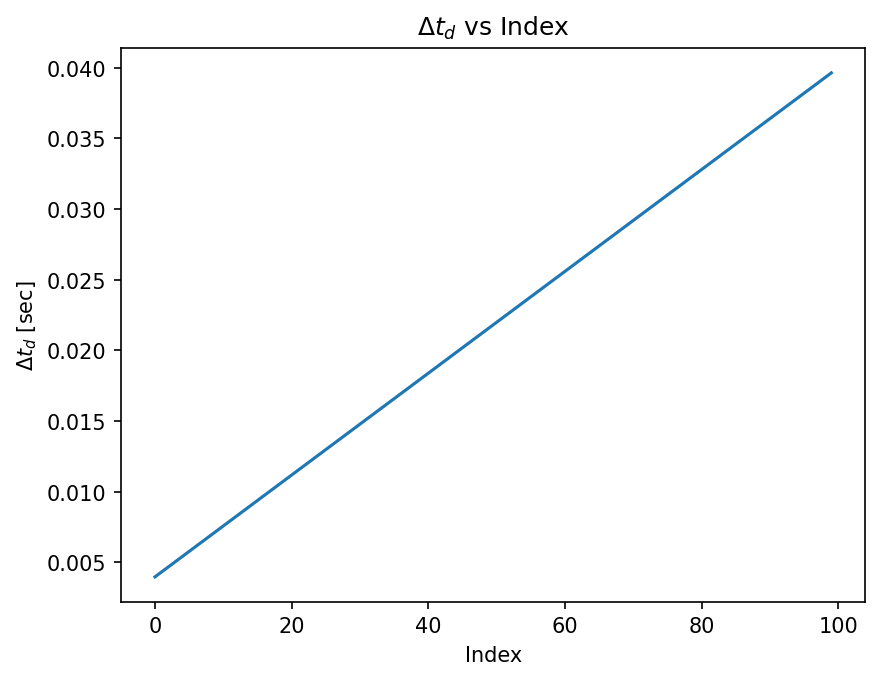

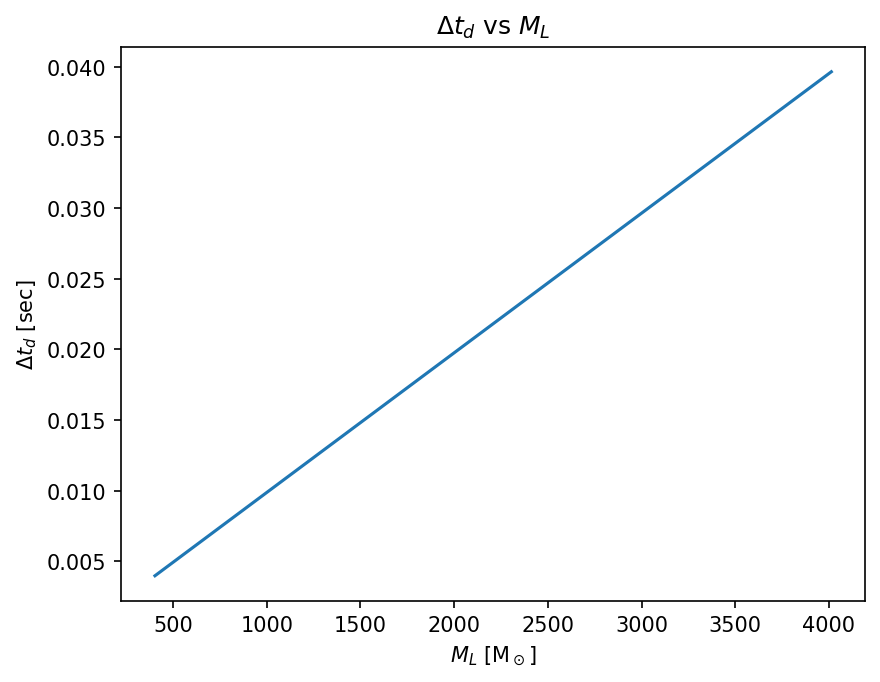

In [53]:
plt.figure()
plt.plot(combined_dict["td_arr"])  # SORTED!!!
plt.xlabel("Index")
plt.ylabel(r"$\Delta t_d$ [sec]")
plt.title(r"$\Delta t_d$ vs Index")
plt.show()

plt.figure()
plt.plot(combined_dict["MLz_arr"], combined_dict["td_arr"])
plt.xlabel(r"$M_L$ [M$_\odot$]")
plt.ylabel(r"$\Delta t_d$ [sec]")
plt.title(r"$\Delta t_d$ vs $M_L$")
plt.show()

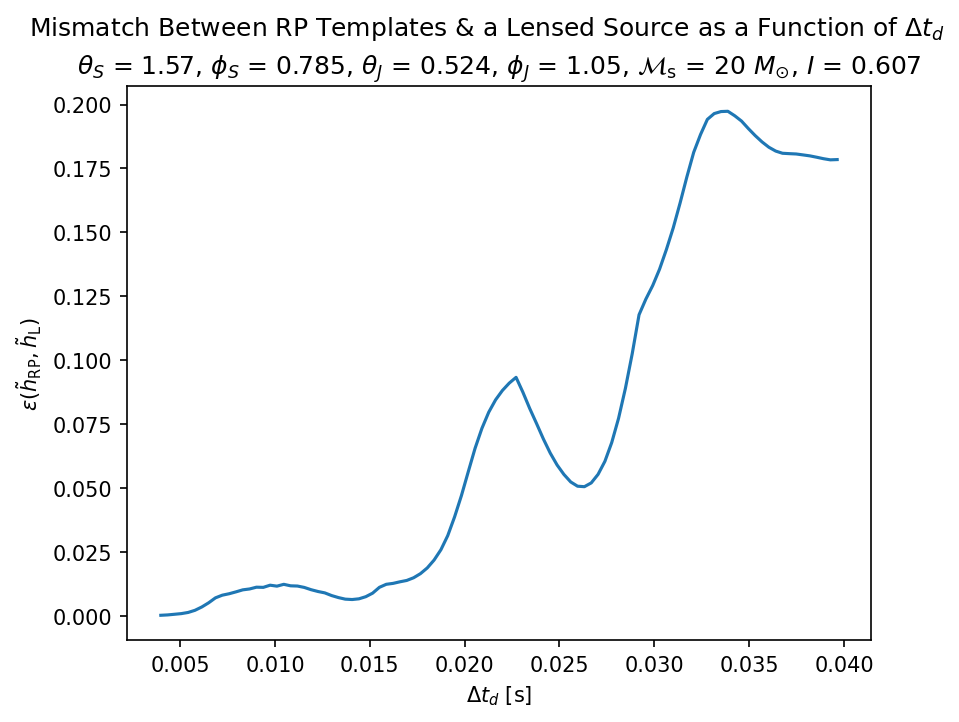

In [54]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_arr = np.array([data_td[td]["stats"]["ep_min"] for td in td_arr])

plt.plot(td_arr, td_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

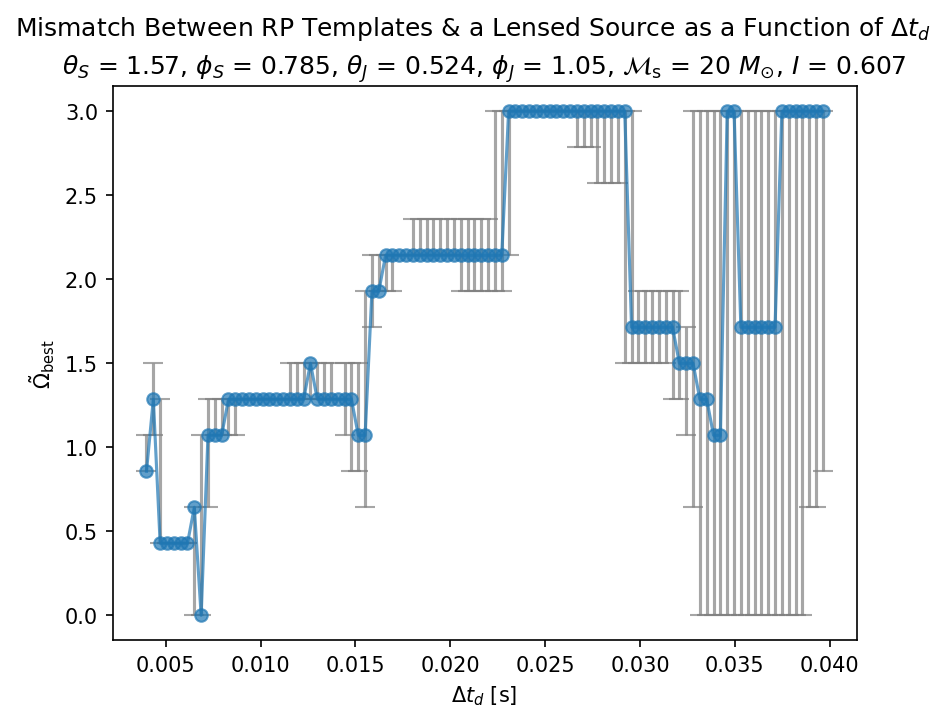

In [55]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_omega_tilde_arr = np.array(
    [data_td[td]["stats"]["ep_min_omega_tilde"] for td in td_arr]
)

plt.errorbar(
    td_arr,
    td_ep_min_omega_tilde_arr,
    yerr=get_asym_err(data_td, td_arr, "omega_tilde"),
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

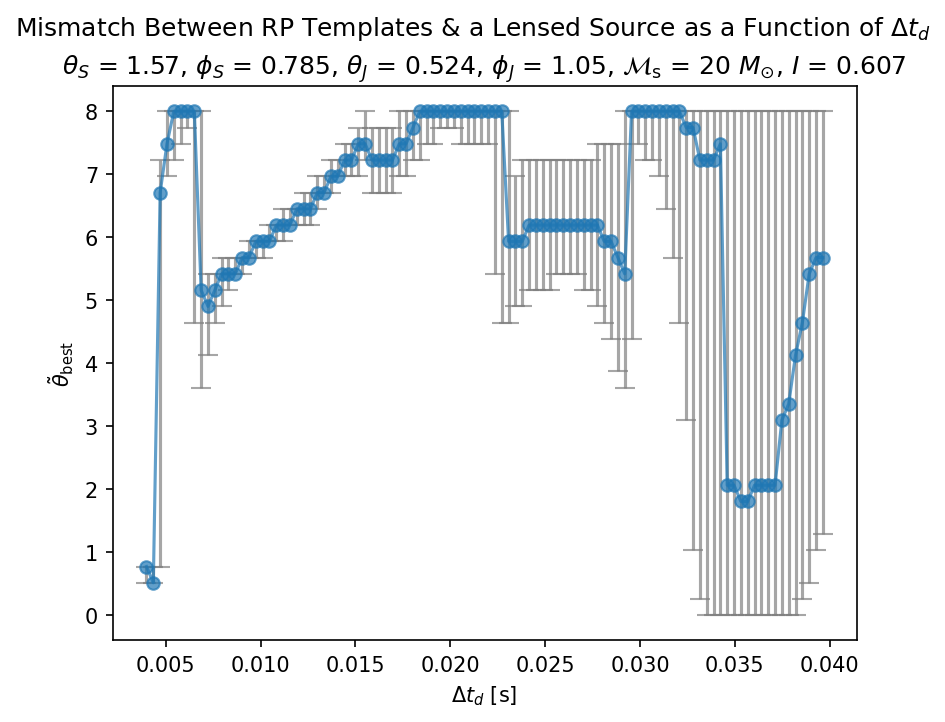

In [56]:
data_td = combined_dict

lens_params = data_td["source_params"]
td_arr = data_td["td_arr"]
td_ep_min_theta_tilde_arr = np.array(
    [data_td[td]["stats"]["ep_min_theta_tilde"] for td in td_arr]
)

plt.errorbar(
    td_arr,
    td_ep_min_theta_tilde_arr,
    yerr=get_asym_err(data_td, td_arr, "theta_tilde"),
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)
plt.xlabel(r"$\Delta t_d$ [s]")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $I$ = {:.3g}".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_td["I"],
    )
)

plt.suptitle(
    r"Mismatch Between RP Templates & a Lensed Source as a Function of $\Delta t_d$"
)

plt.show()

# as a function of $I$ while fixing $\Delta t_d$

## testing

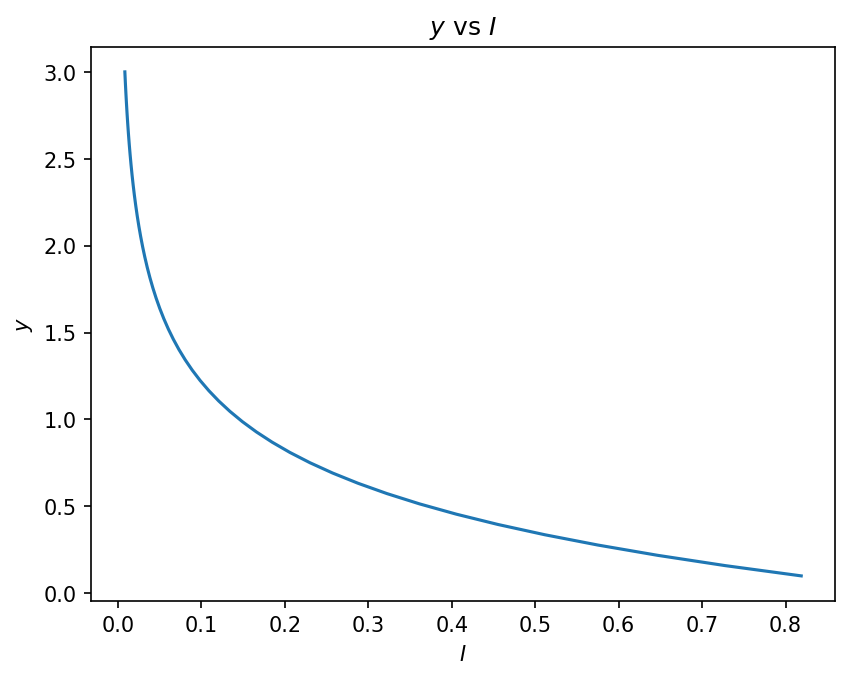

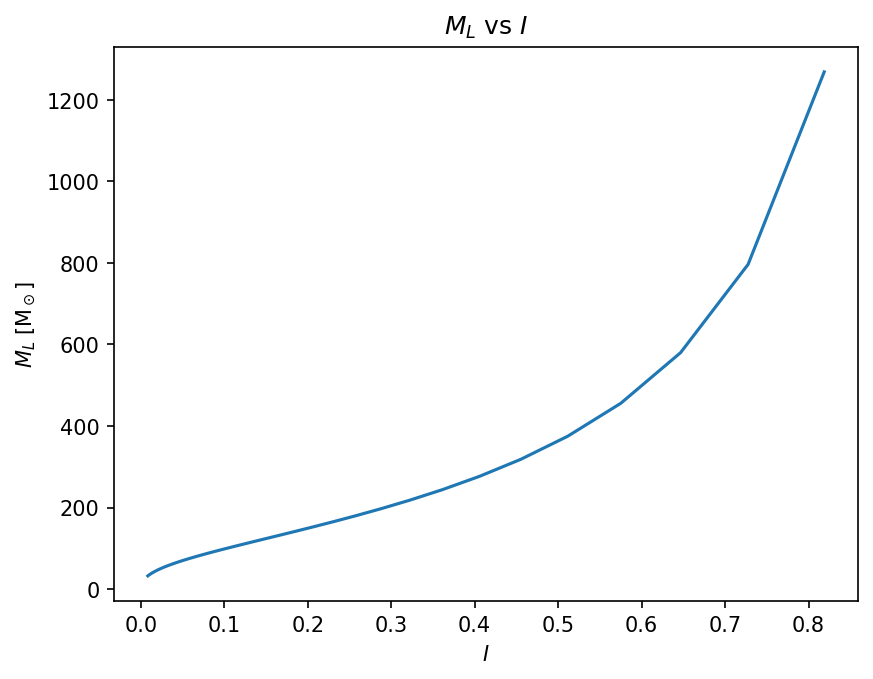

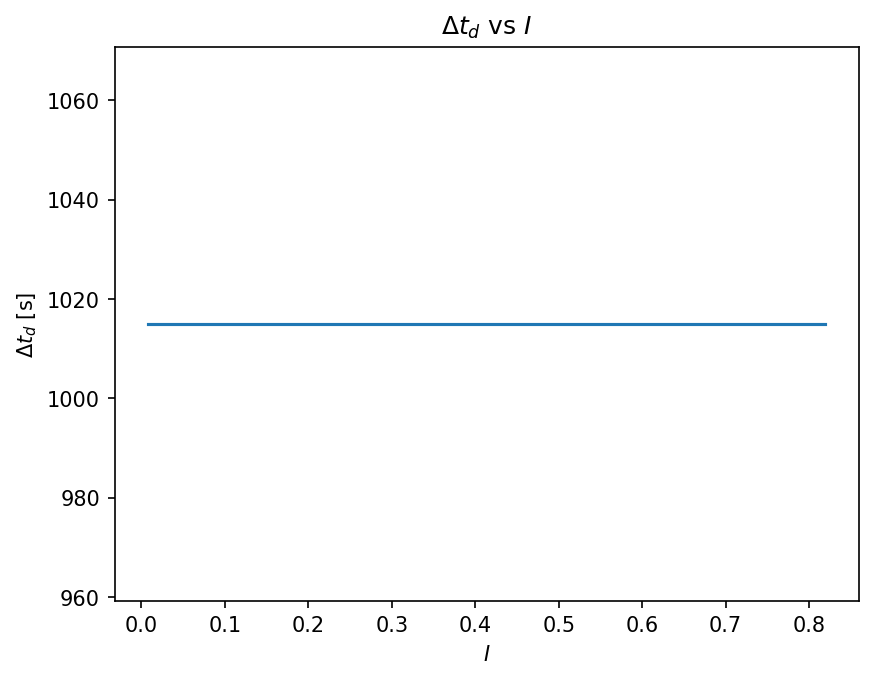

In [58]:
lens_params = copy.deepcopy(lens_params_1)

td = 0.005
y_arr = np.linspace(0.1, 3, 50)
MLz_arr = get_MLz_from_td(td, y_arr)
I_arr = np.zeros(len(y_arr))
td_arr = np.zeros(len(y_arr))

for i in range(len(y_arr)):
    lens_params["y"] = y_arr[i]
    lens_params["MLz"] = MLz_arr[i]
    lens_inst = LensingGeo(lens_params)
    I = lens_inst.I()
    td = lens_inst.td()
    I_arr[i] = I
    td_arr[i] = td

plt.plot(I_arr, y_arr)
plt.xlabel(r"$I$")
plt.ylabel(r"$y$")
plt.title(r"$y$ vs $I$")
plt.show()

plt.plot(I_arr, MLz_arr)
plt.xlabel(r"$I$")
plt.ylabel(r"$M_L$ [M$_\odot$]")
plt.title(r"$M_L$ vs $I$")
plt.show()

plt.plot(I_arr, td_arr)
plt.xlabel(r"$I$")
plt.ylabel(r"$\Delta t_d$ [s]")
plt.title(r"$\Delta t_d$ vs $I$")
plt.show()

## plot data for $I$

In [60]:
file_pattern = "../data/mismatch_contours_mcz20_I_*.pkl"
files = glob.glob(file_pattern)

combined_dict = {}
combined_I_arr = np.array([])
combined_y_arr = np.array([])
combined_MLz_arr = np.array([])

for file in files:
    with open(file, "rb") as f:
        data = pickle.load(f)
        combined_dict.update(data)
        combined_I_arr = np.append(combined_I_arr, data["I_arr"])
        combined_y_arr = np.append(combined_y_arr, data["y_arr"])
        combined_MLz_arr = np.append(combined_MLz_arr, data["MLz_arr"])

sorted_indices = np.argsort(combined_y_arr)  # y_arr is the input parameter
combined_dict["y_arr"] = combined_y_arr[sorted_indices]
combined_dict["MLz_arr"] = combined_MLz_arr[sorted_indices]
combined_dict["I_arr"] = combined_I_arr[sorted_indices]

combined_dict

{0.240687: {'contour': {'omega_matrix': array([[0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1.5       , 1.71428571, 1.92857143,
           2.14285714, 2.35714286, 2.57142857, 2.78571429, 3.        ],
          [0.        , 0.21428571, 0.42857143, 0.64285714, 0.85714286,
           1.07142857, 1.28571429, 1

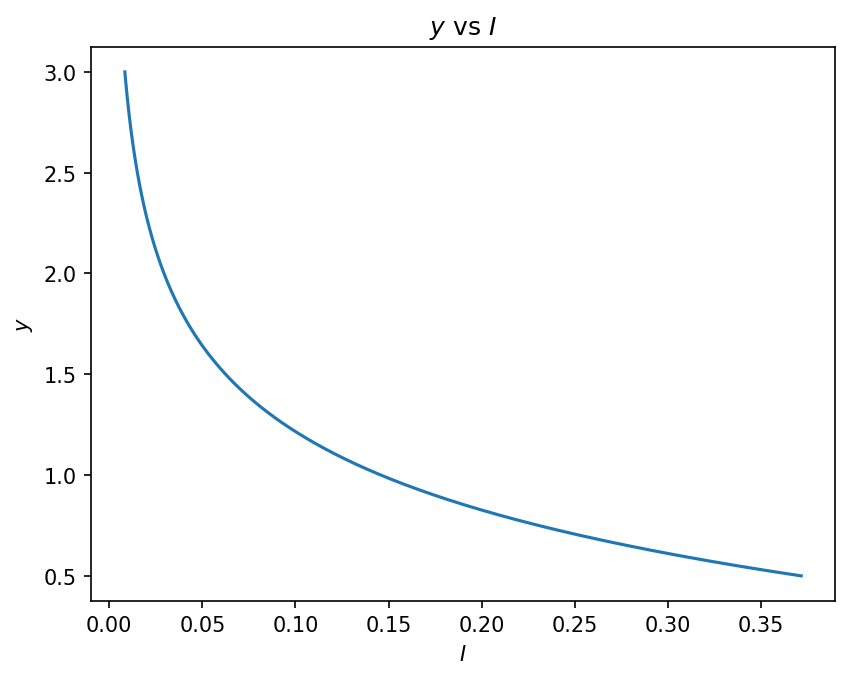

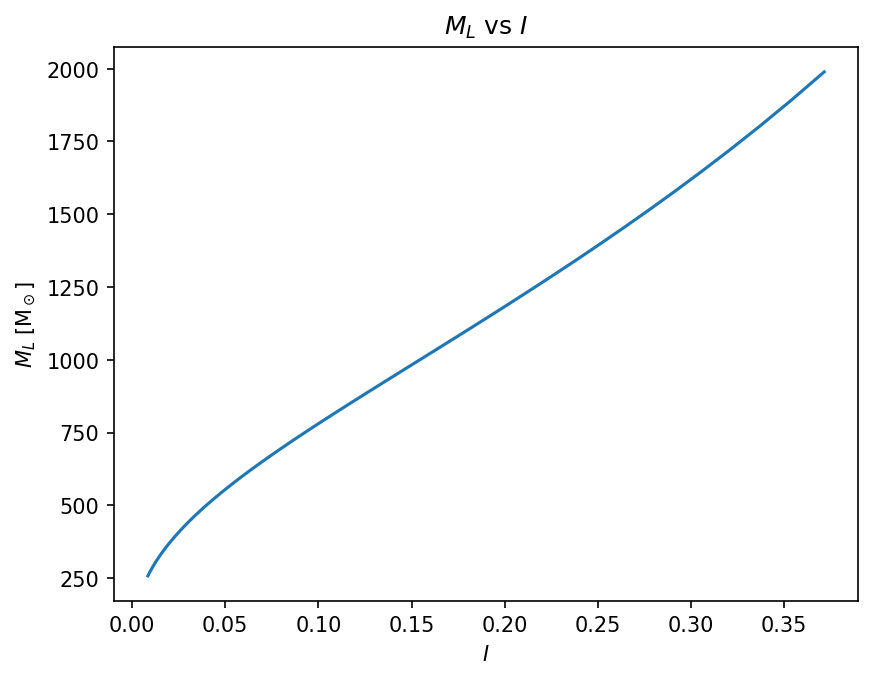

In [61]:
plt.figure()
plt.plot(combined_dict["I_arr"], combined_dict["y_arr"])
plt.xlabel(r"$I$")
plt.ylabel(r"$y$")
plt.title(r"$y$ vs $I$")
plt.show()

plt.figure()
plt.plot(combined_dict["I_arr"], combined_dict["MLz_arr"])
plt.xlabel(r"$I$")
plt.ylabel(r"$M_L$ [M$_\odot$]")
plt.title(r"$M_L$ vs $I$")
plt.show()

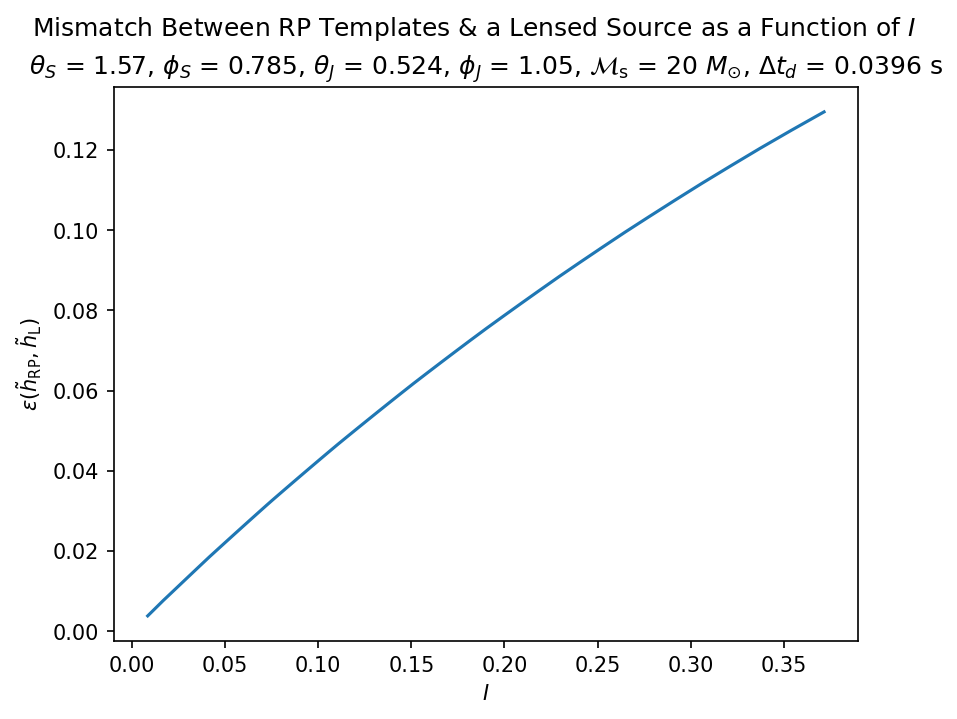

In [48]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_arr = np.array([data_I[I]["stats"]["ep_min"] for I in I_arr])

plt.plot(I_arr, I_ep_min_arr, label=r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")
plt.xlabel(r"$I$")
plt.ylabel(r"$\epsilon(\~h_{\rm RP}, \~h_{\rm L})$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

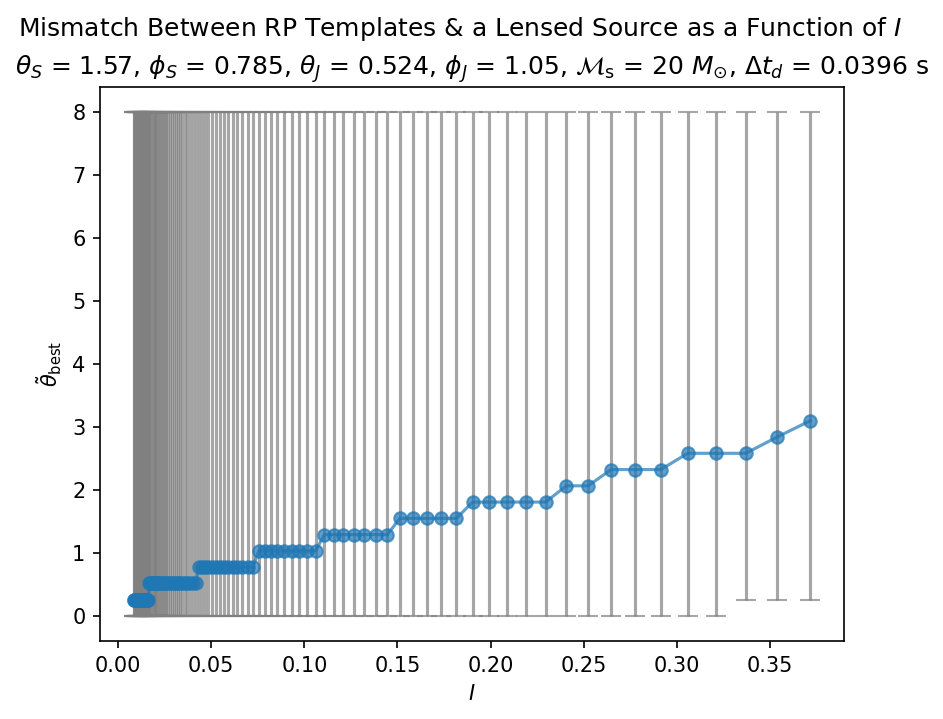

In [49]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_theta_tilde_arr = np.array(
    [data_I[I]["stats"]["ep_min_theta_tilde"] for I in I_arr]
)

plt.errorbar(
    I_arr,
    I_ep_min_theta_tilde_arr,
    yerr=get_asym_err(data_I, I_arr, "theta_tilde"),
    fmt="-o",
    label=r"$\~{\theta}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\theta}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

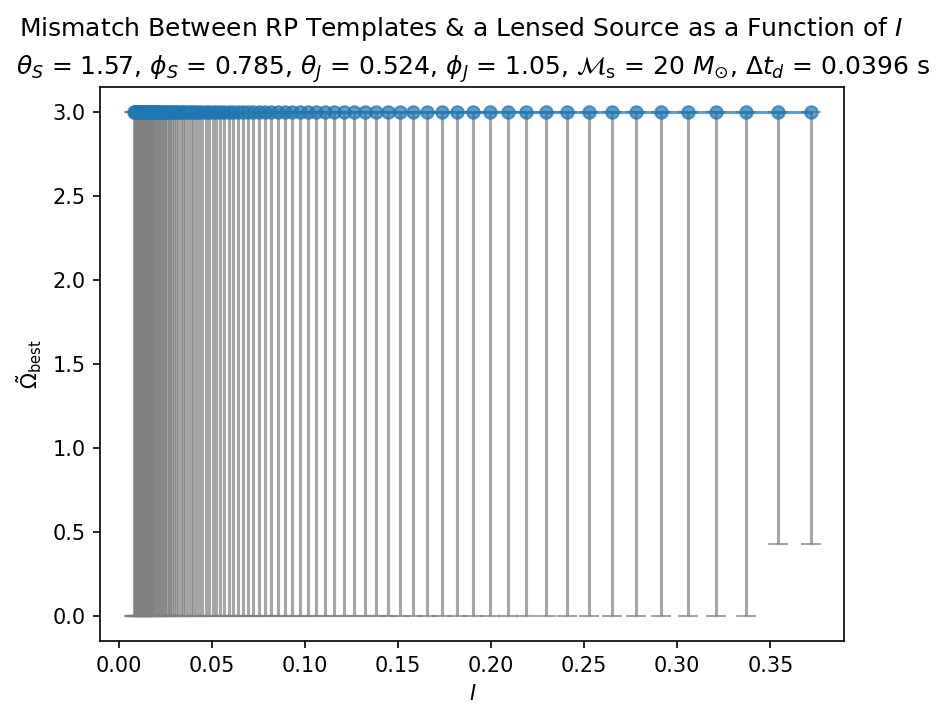

In [50]:
data_I = combined_dict

lens_params = data_I["source_params"]
I_arr = data_I["I_arr"]
I_ep_min_omega_tilde_arr = np.array(
    [data_I[I]["stats"]["ep_min_omega_tilde"] for I in I_arr]
)

plt.errorbar(
    I_arr,
    I_ep_min_omega_tilde_arr,
    yerr=get_asym_err(data_I, I_arr, "omega_tilde"),
    fmt="-o",
    label=r"$\~{\Omega}_{\rm best}$",
    capsize=5,
    ecolor="grey",
    alpha=0.7,
)

plt.xlabel(r"$I$")
plt.ylabel(r"$\~{\Omega}_{\rm best}$")

plt.title(
    r"$\theta_S$ = {:.3g}, $\phi_S$ = {:.3g}, $\theta_J$ = {:.3g}, $\phi_J$ = {:.3g}, {} = {:.3g} {}, $\Delta t_d$ = {:.3g} s".format(
        lens_params["theta_S"],
        lens_params["phi_S"],
        lens_params["theta_J"],
        lens_params["phi_J"],
        r"$\mathcal{M}_{\text{s}}$",
        lens_params["mcz"] / solar_mass,
        r"$M_{\odot}$",
        data_I["td"],
    )
)

plt.suptitle(r"Mismatch Between RP Templates & a Lensed Source as a Function of $I$")

plt.show()

# waveform comparison

idx = -6.64285e-09, phi = -1.15464e-08, both should be ~0 if get_updated_mismatch_results is True


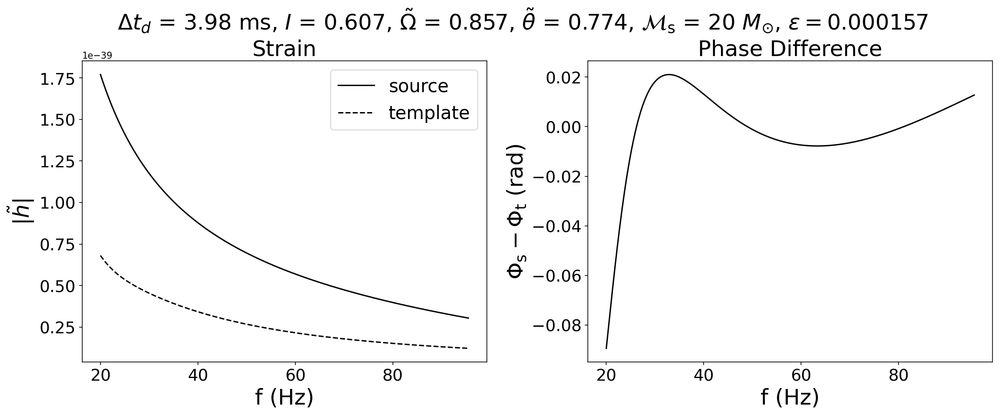

idx = 8.47809e-09, phi = 1.0554e-09, both should be ~0 if get_updated_mismatch_results is True


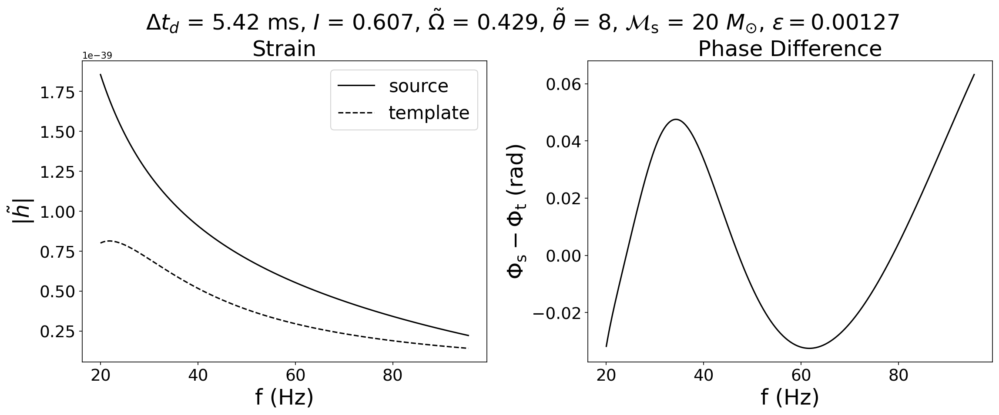

idx = 3.31993e-09, phi = 2.50685e-08, both should be ~0 if get_updated_mismatch_results is True


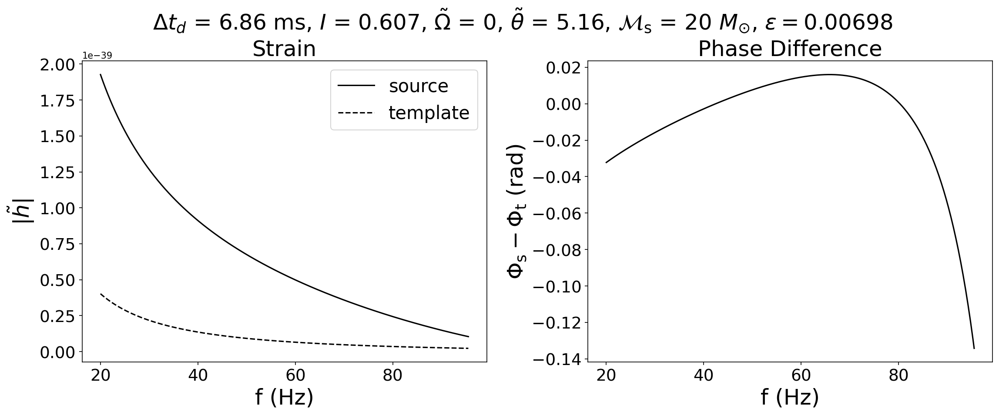

idx = -7.15319e-09, phi = -1.45936e-08, both should be ~0 if get_updated_mismatch_results is True


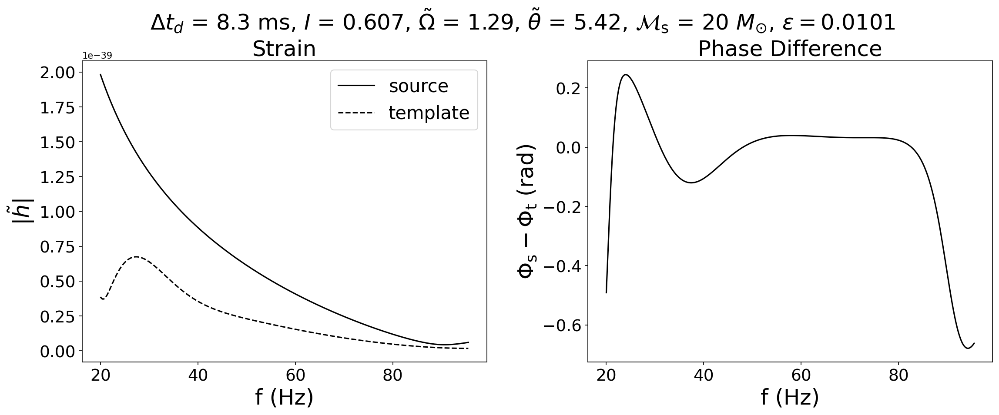

idx = 7.84979e-09, phi = -3.59155e-09, both should be ~0 if get_updated_mismatch_results is True


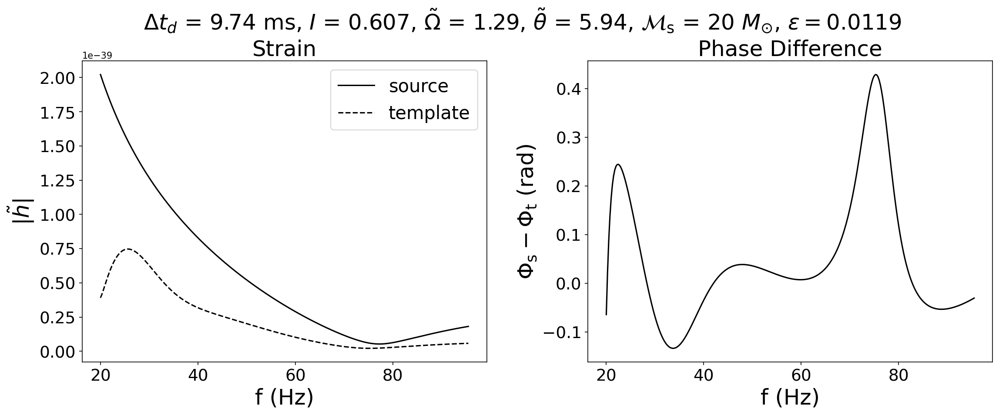

idx = 6.08756e-09, phi = 1.73145e-08, both should be ~0 if get_updated_mismatch_results is True


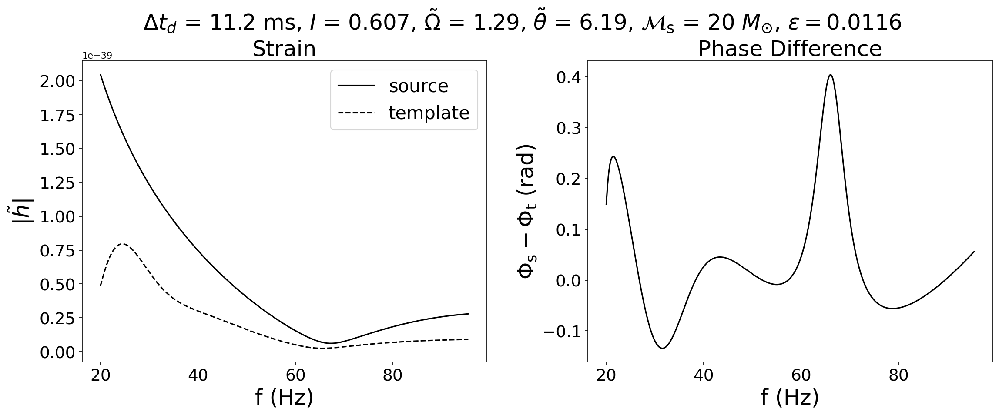

idx = -5.24262e-10, phi = 1.90537e-08, both should be ~0 if get_updated_mismatch_results is True


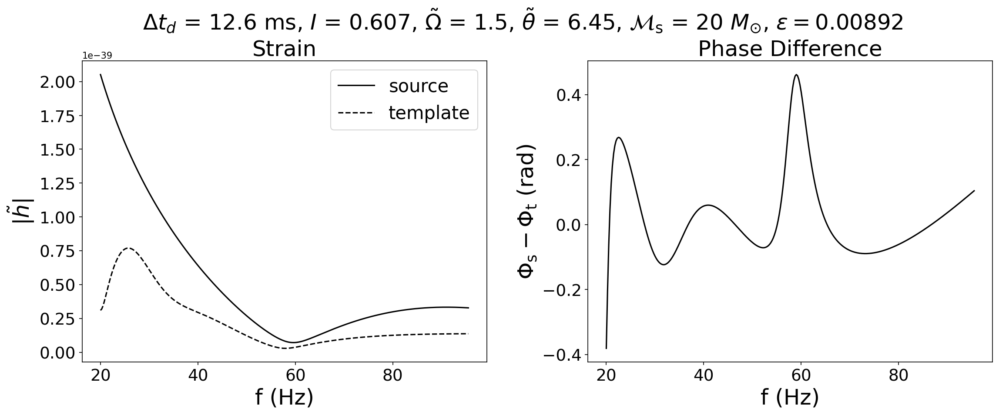

idx = 2.00143e-09, phi = -4.28087e-08, both should be ~0 if get_updated_mismatch_results is True


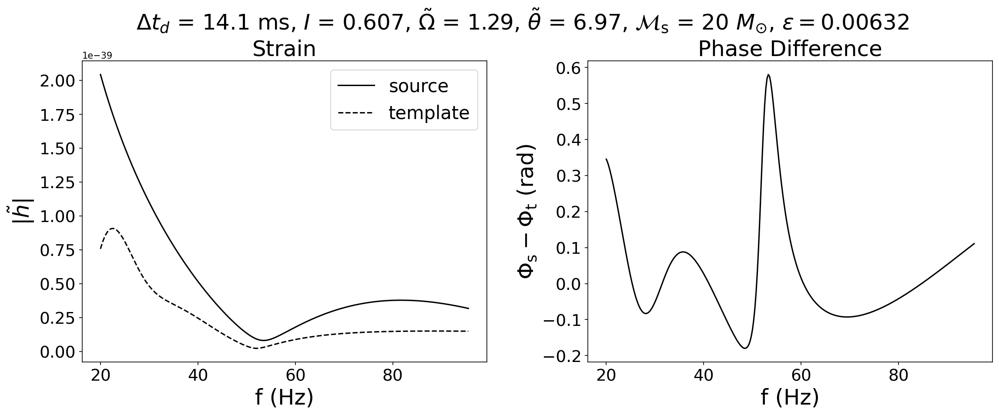

idx = -1.52023e-08, phi = -1.35067e-08, both should be ~0 if get_updated_mismatch_results is True


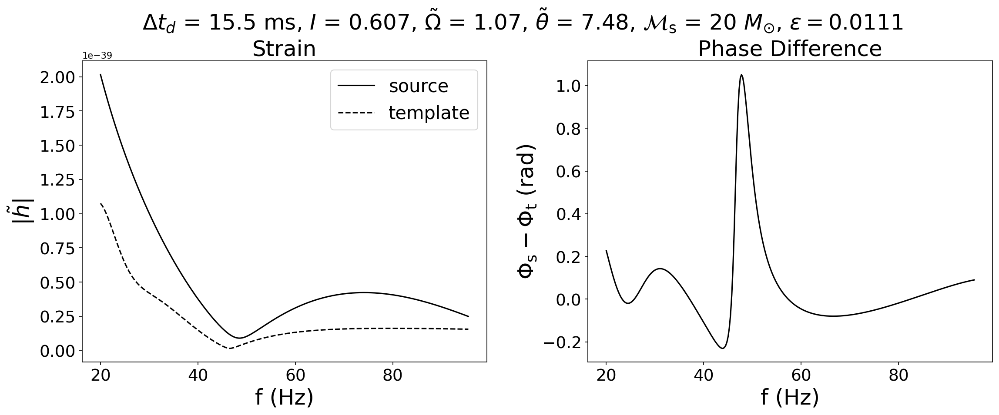

idx = -1.86738e-08, phi = -3.04645e-08, both should be ~0 if get_updated_mismatch_results is True


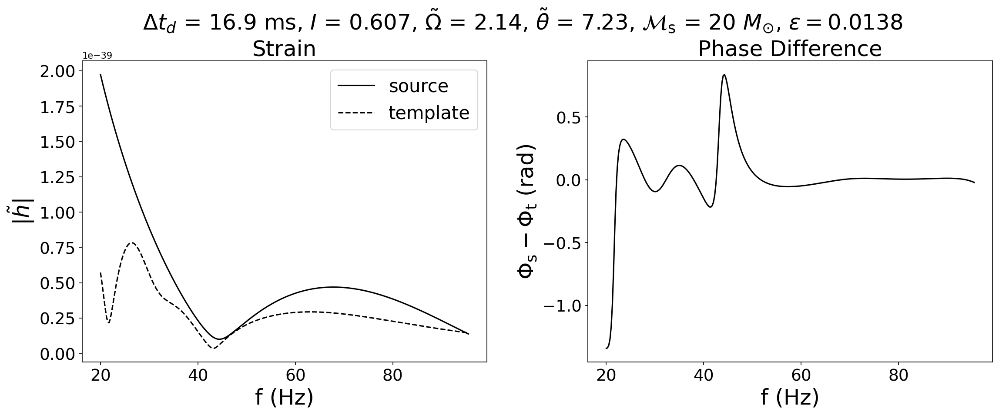

idx = -3.19712e-09, phi = -1.49117e-08, both should be ~0 if get_updated_mismatch_results is True


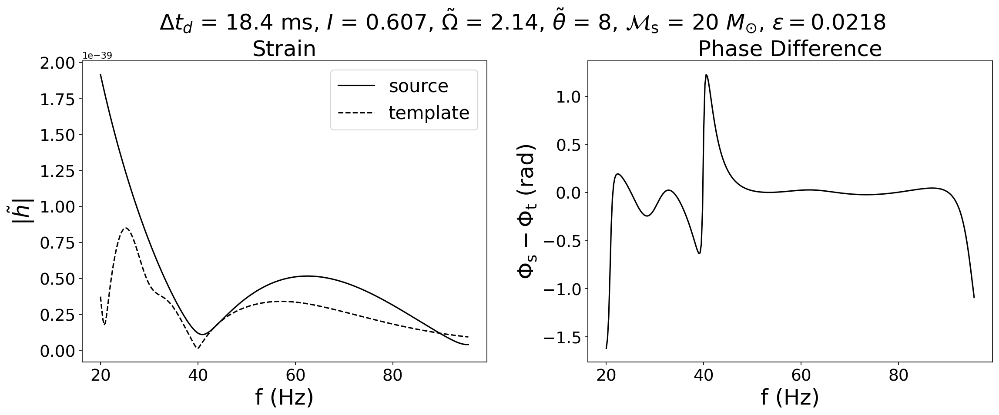

idx = 2.19757e-09, phi = 1.10066e-08, both should be ~0 if get_updated_mismatch_results is True


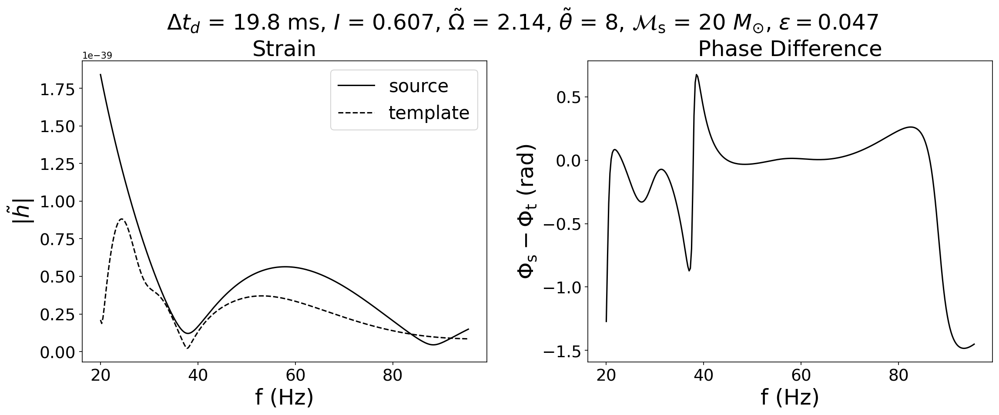

idx = -7.61097e-09, phi = -3.76962e-08, both should be ~0 if get_updated_mismatch_results is True


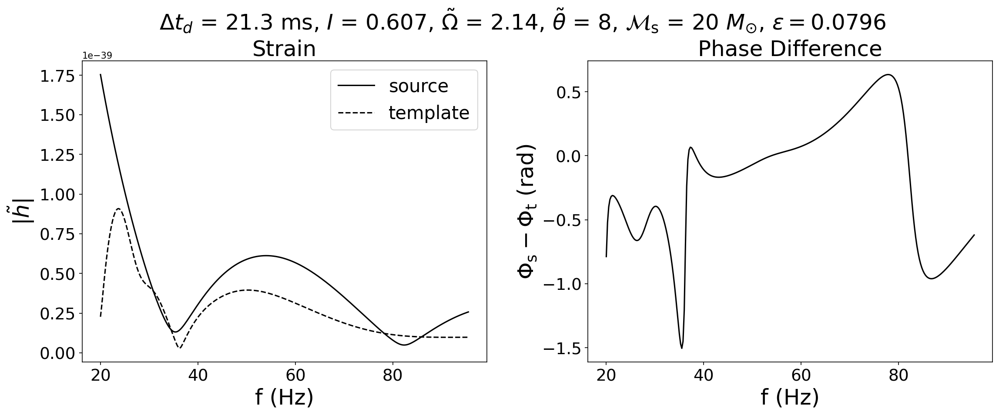

idx = -2.18383e-08, phi = 2.71997e-08, both should be ~0 if get_updated_mismatch_results is True


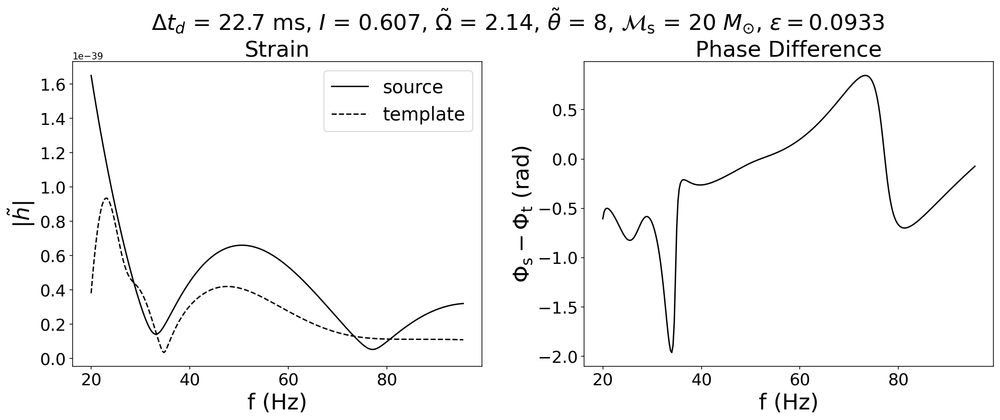

idx = 1.17428e-08, phi = -3.14905e-08, both should be ~0 if get_updated_mismatch_results is True


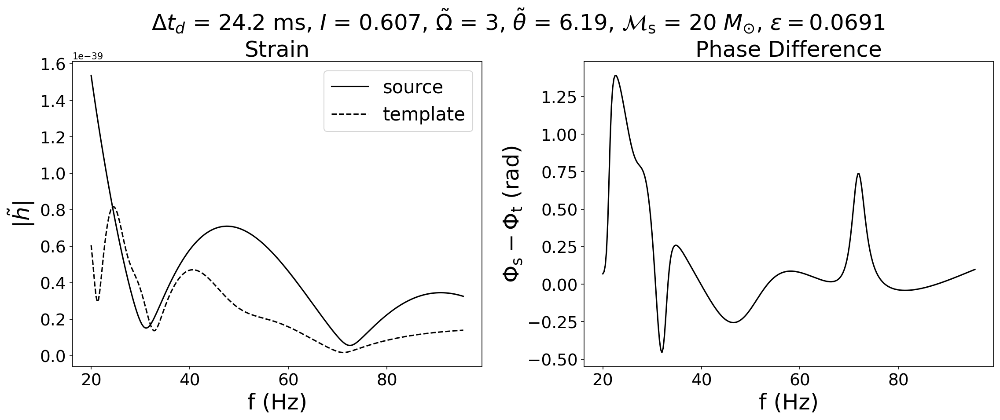

idx = 2.27033e-08, phi = -6.17566e-09, both should be ~0 if get_updated_mismatch_results is True


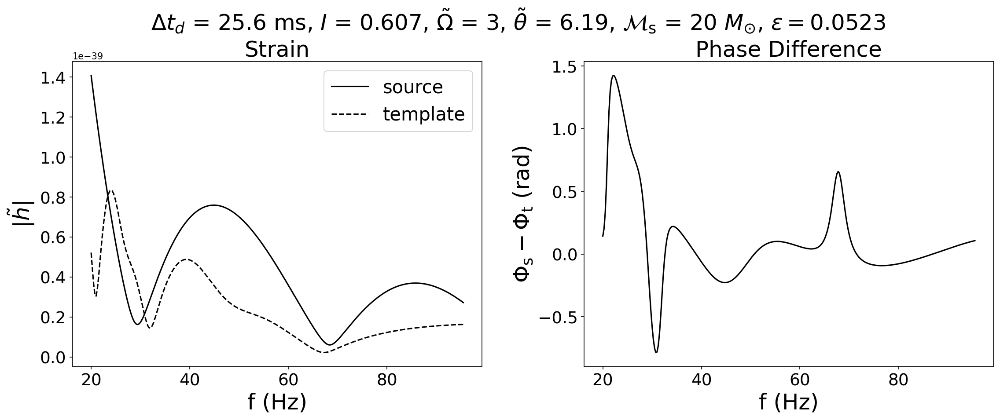

idx = 8.79102e-09, phi = 1.67029e-08, both should be ~0 if get_updated_mismatch_results is True


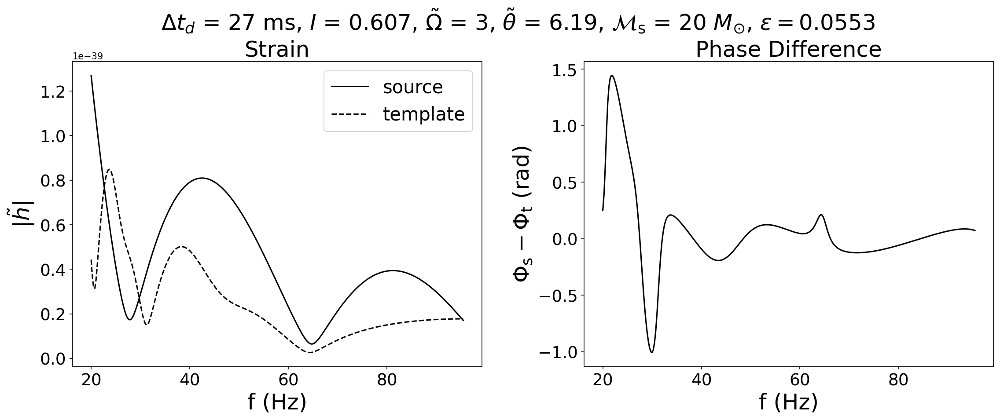

idx = -2.98344e-10, phi = -2.98575e-09, both should be ~0 if get_updated_mismatch_results is True


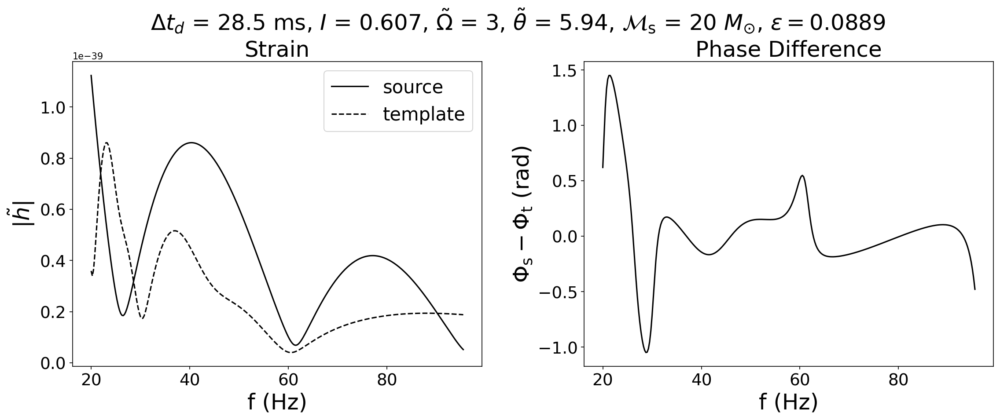

idx = -8.07766e-09, phi = 1.09449e-08, both should be ~0 if get_updated_mismatch_results is True


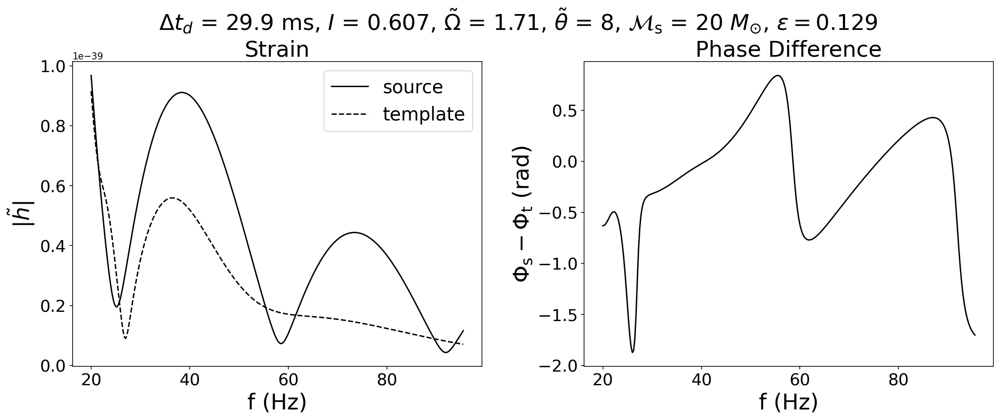

idx = 2.7975e-08, phi = -3.97449e-08, both should be ~0 if get_updated_mismatch_results is True


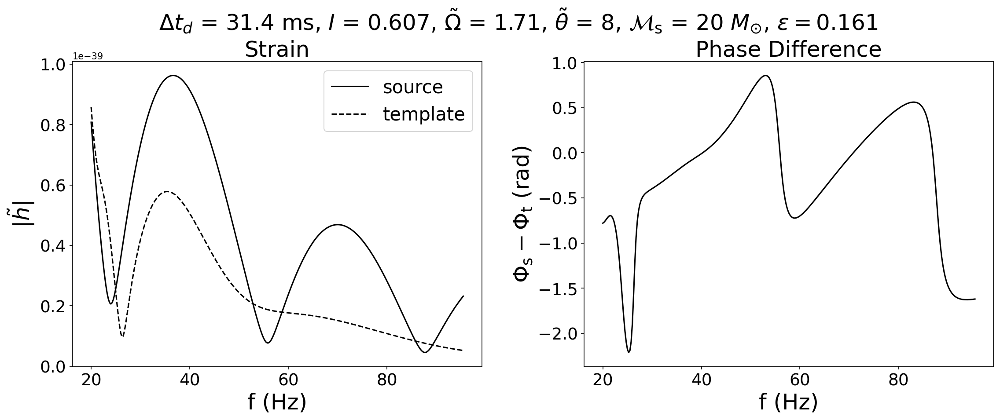

idx = -5.73494e-09, phi = 2.35323e-09, both should be ~0 if get_updated_mismatch_results is True


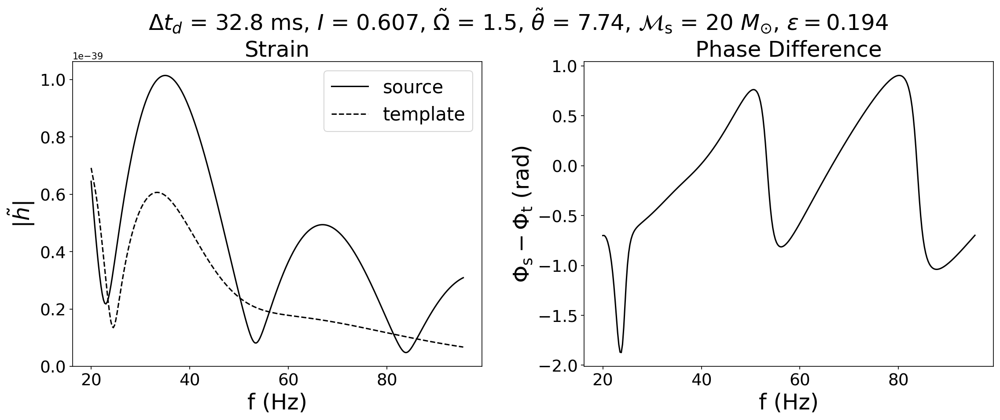

idx = 1.24156e-08, phi = 8.9749e-12, both should be ~0 if get_updated_mismatch_results is True


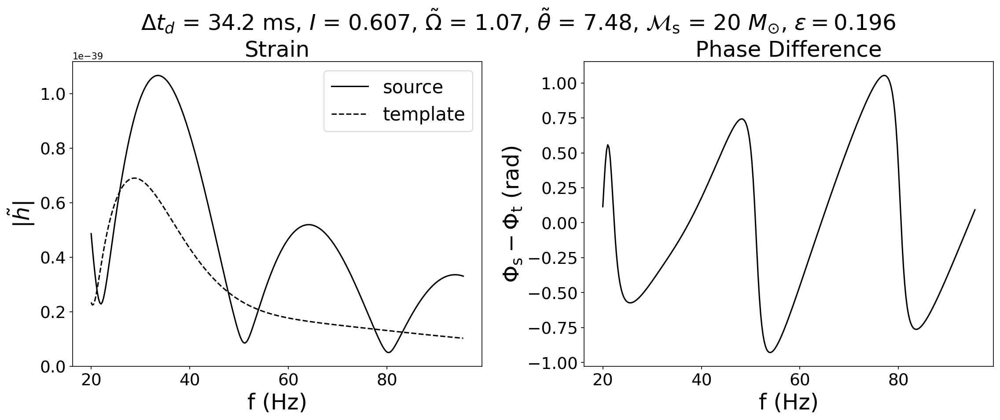

idx = -3.81215e-09, phi = 7.74848e-09, both should be ~0 if get_updated_mismatch_results is True


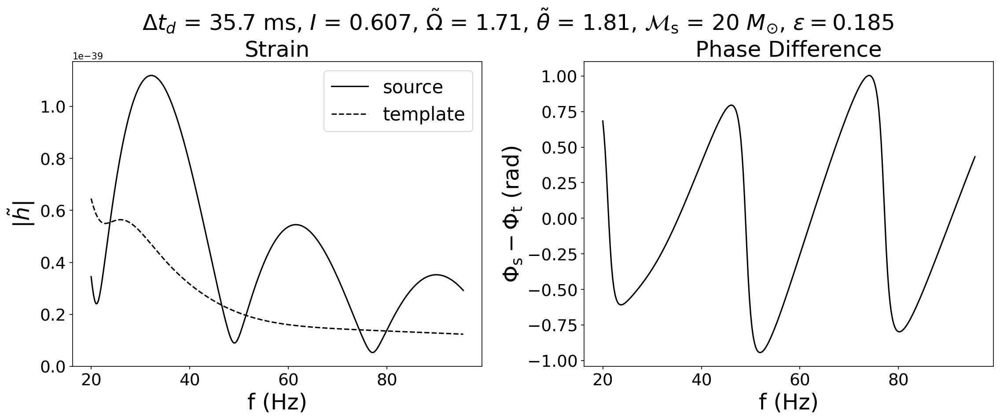

idx = 1.31694e-09, phi = 1.08074e-08, both should be ~0 if get_updated_mismatch_results is True


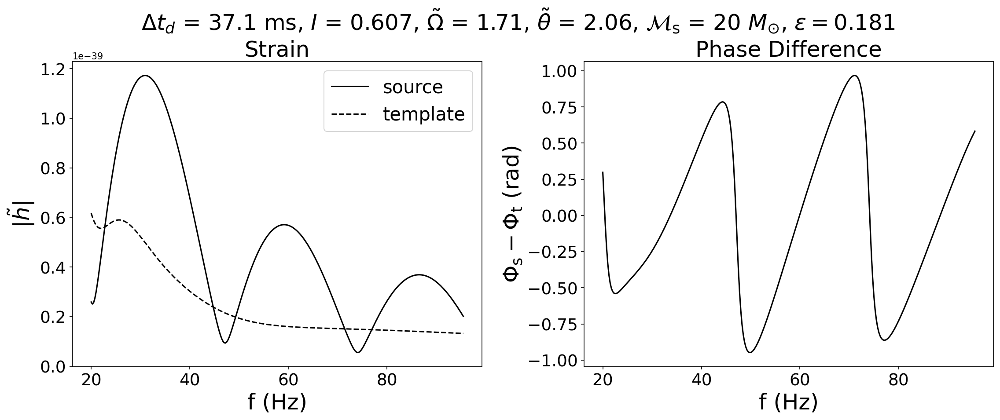

idx = 7.76093e-09, phi = -1.93875e-08, both should be ~0 if get_updated_mismatch_results is True


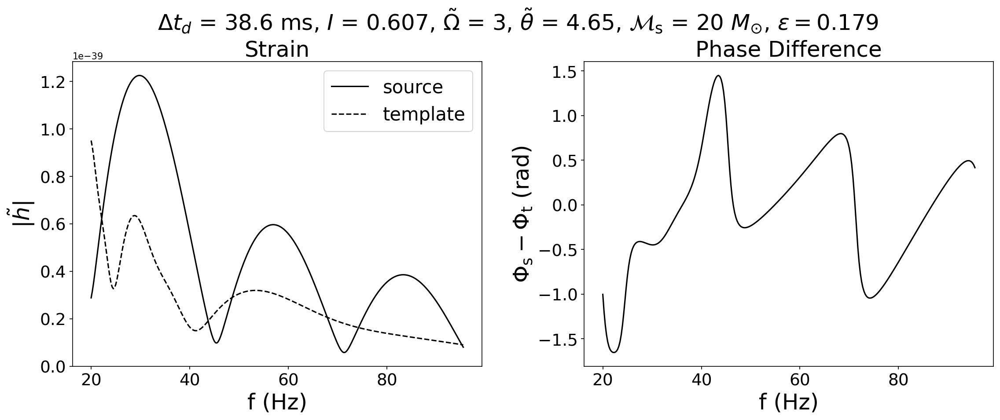

In [57]:
lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)

MLz_arr = data_td["MLz_arr"]
td_arr = data_td["td_arr"]

for i in range(0, len(MLz_arr), 4):
    lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_td[td_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_td[td_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()

idx = 7.10449e-09, phi = -2.80942e-08, both should be ~0 if get_updated_mismatch_results is True


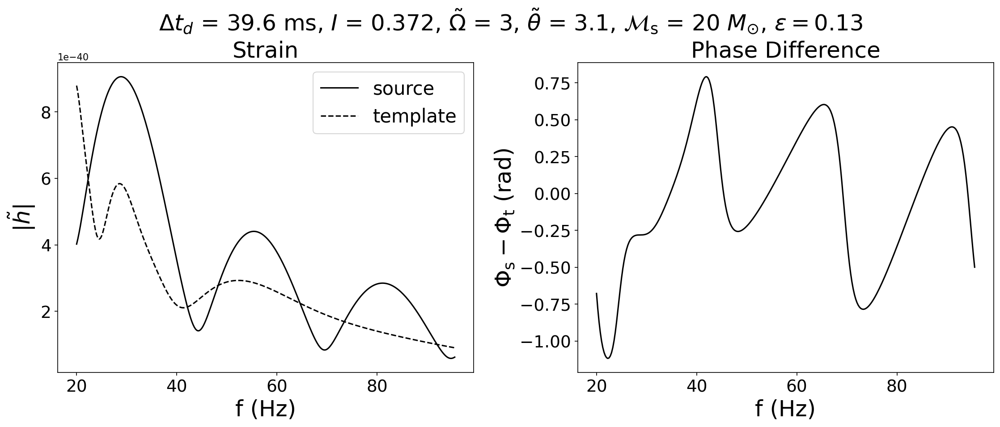

idx = 6.69281e-09, phi = -2.96393e-08, both should be ~0 if get_updated_mismatch_results is True


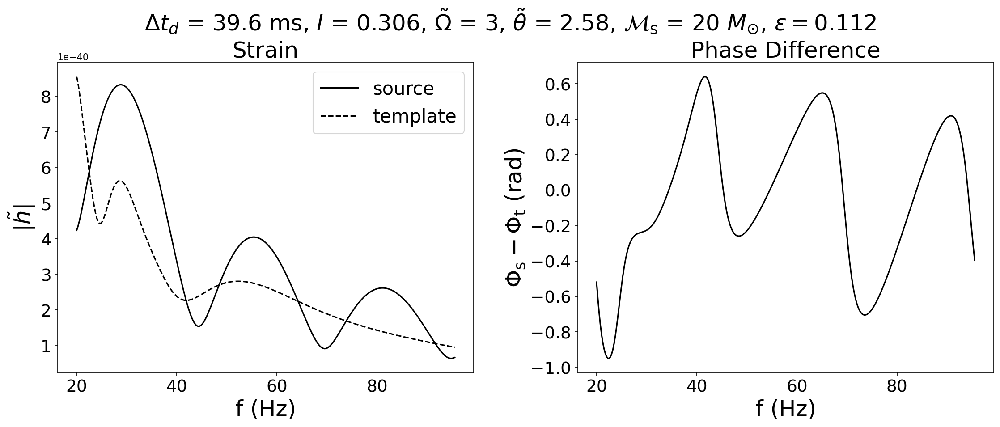

idx = -4.59337e-09, phi = 1.74375e-08, both should be ~0 if get_updated_mismatch_results is True


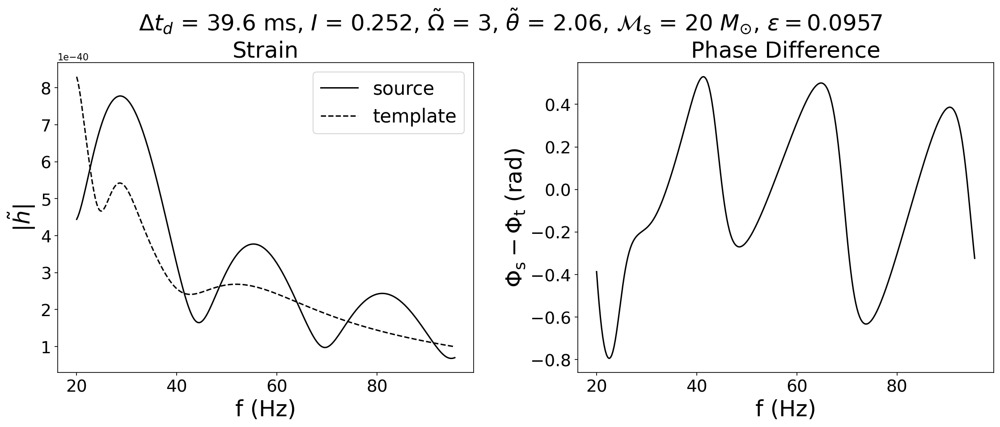

idx = -3.72338e-09, phi = -1.51454e-08, both should be ~0 if get_updated_mismatch_results is True


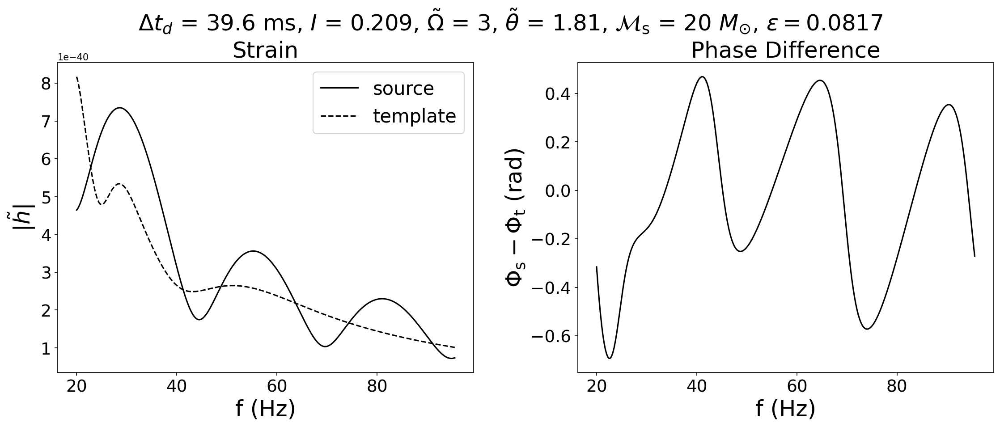

idx = 7.15774e-09, phi = -2.50933e-08, both should be ~0 if get_updated_mismatch_results is True


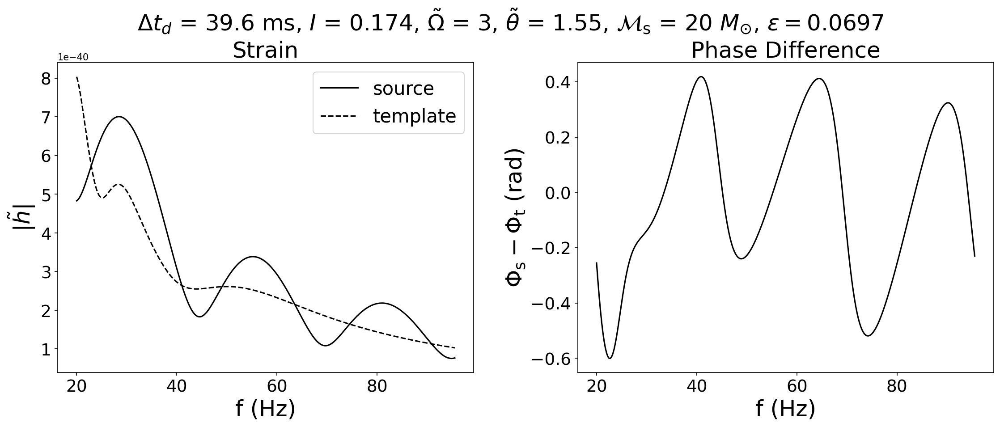

idx = 4.24867e-10, phi = -1.8588e-08, both should be ~0 if get_updated_mismatch_results is True


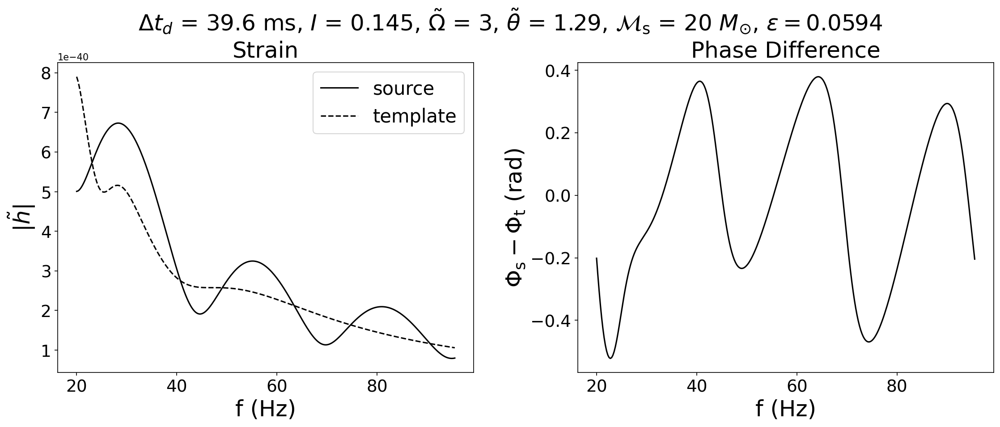

idx = -6.93792e-10, phi = -4.56055e-09, both should be ~0 if get_updated_mismatch_results is True


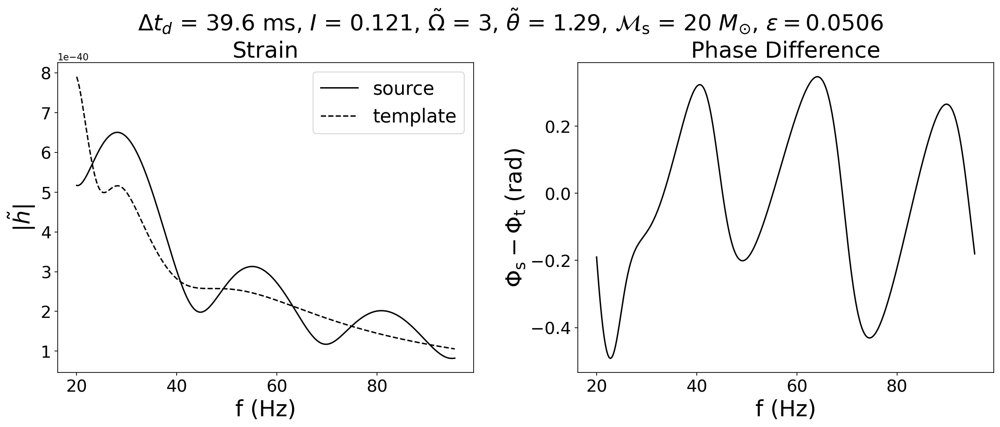

idx = -1.32225e-09, phi = 1.16256e-08, both should be ~0 if get_updated_mismatch_results is True


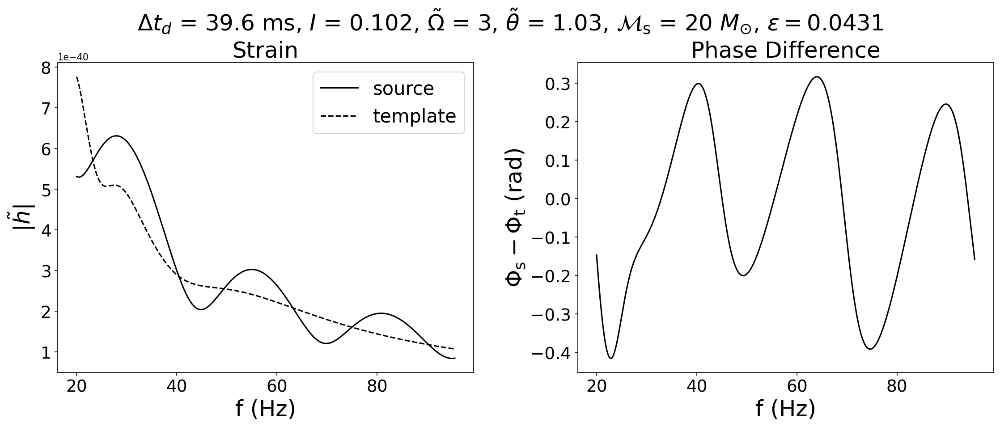

idx = -2.56127e-08, phi = 2.77603e-09, both should be ~0 if get_updated_mismatch_results is True


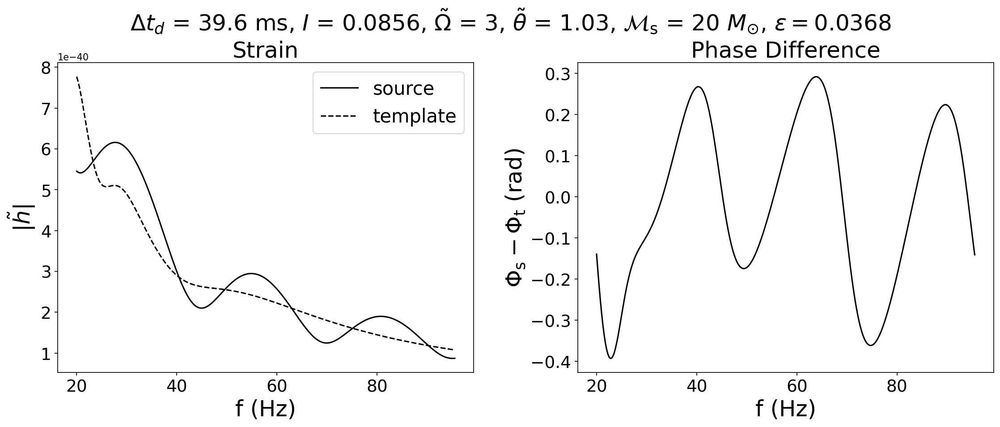

idx = 1.12499e-08, phi = -2.95468e-08, both should be ~0 if get_updated_mismatch_results is True


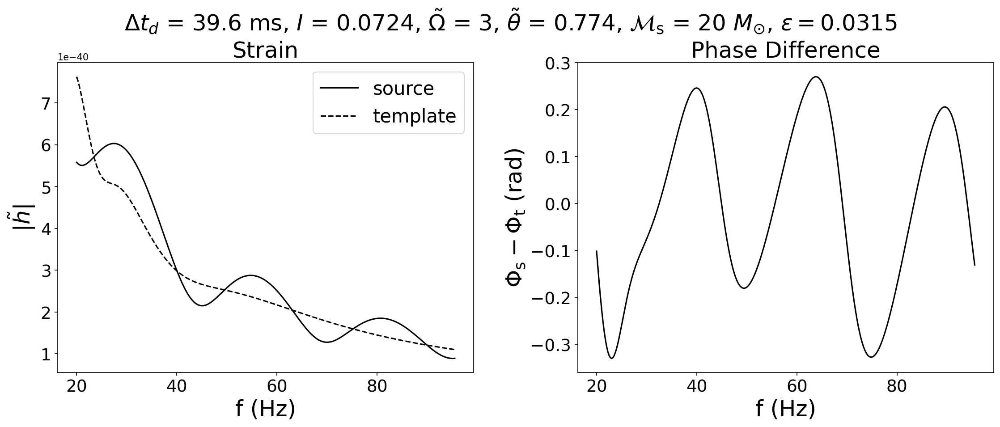

idx = 1.32053e-08, phi = 9.6174e-09, both should be ~0 if get_updated_mismatch_results is True


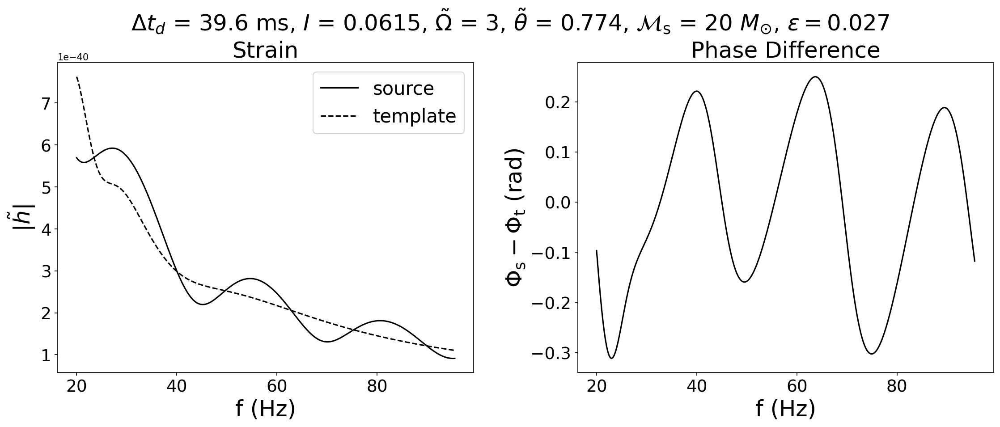

idx = 1.99728e-08, phi = 9.76976e-09, both should be ~0 if get_updated_mismatch_results is True


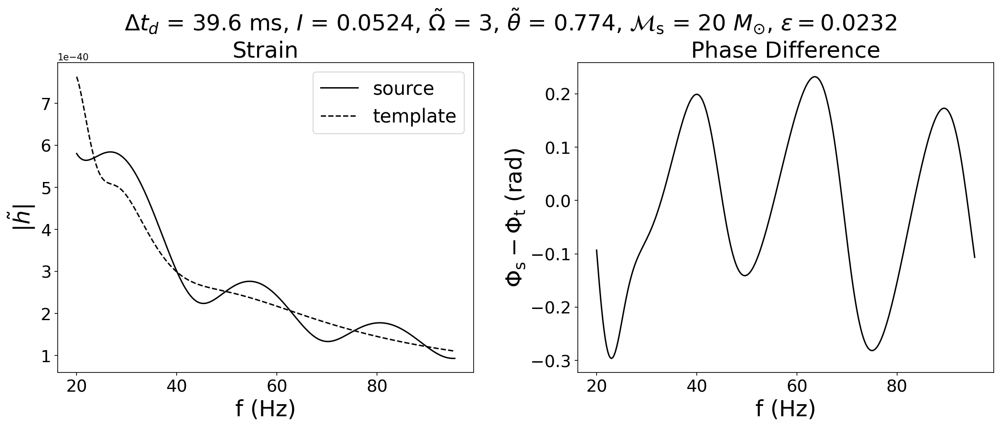

idx = -9.37691e-10, phi = 6.18964e-10, both should be ~0 if get_updated_mismatch_results is True


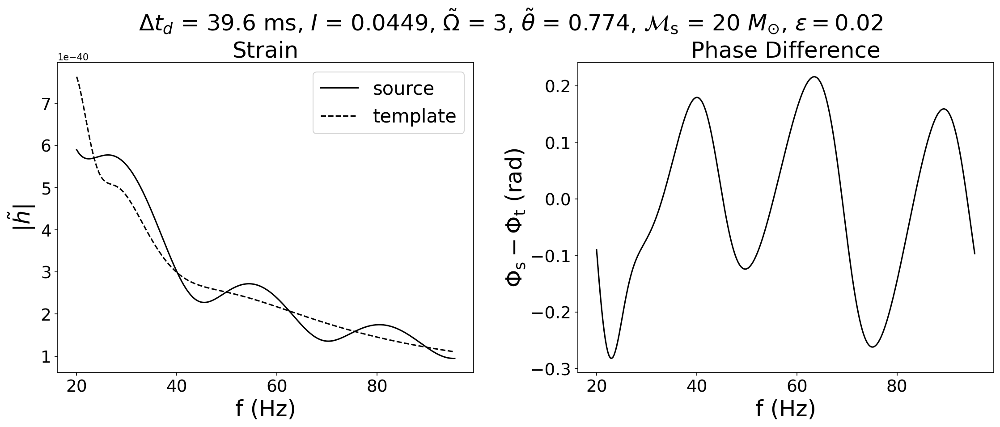

idx = 5.65921e-09, phi = -2.97711e-12, both should be ~0 if get_updated_mismatch_results is True


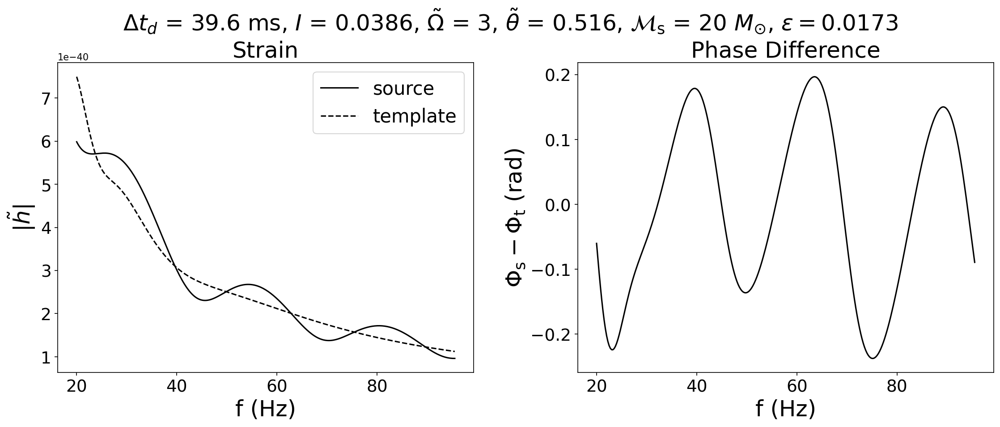

idx = 3.09837e-09, phi = -3.43422e-08, both should be ~0 if get_updated_mismatch_results is True


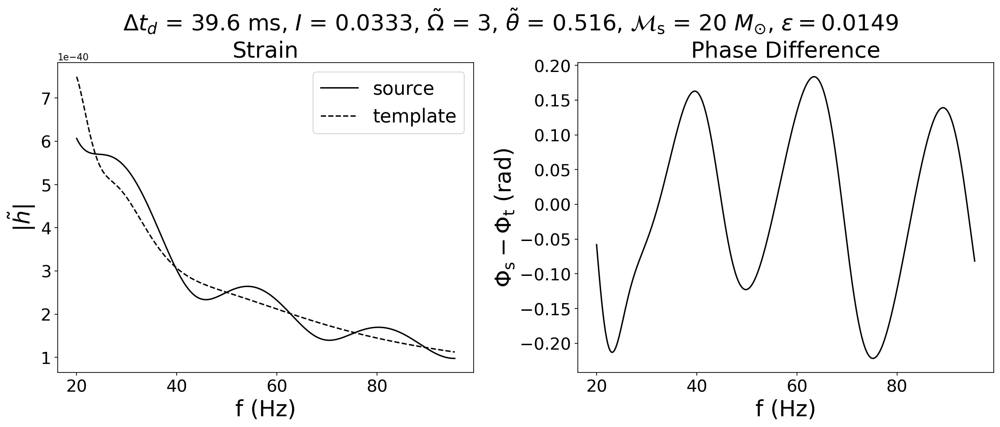

idx = -1.89846e-09, phi = -1.16608e-08, both should be ~0 if get_updated_mismatch_results is True


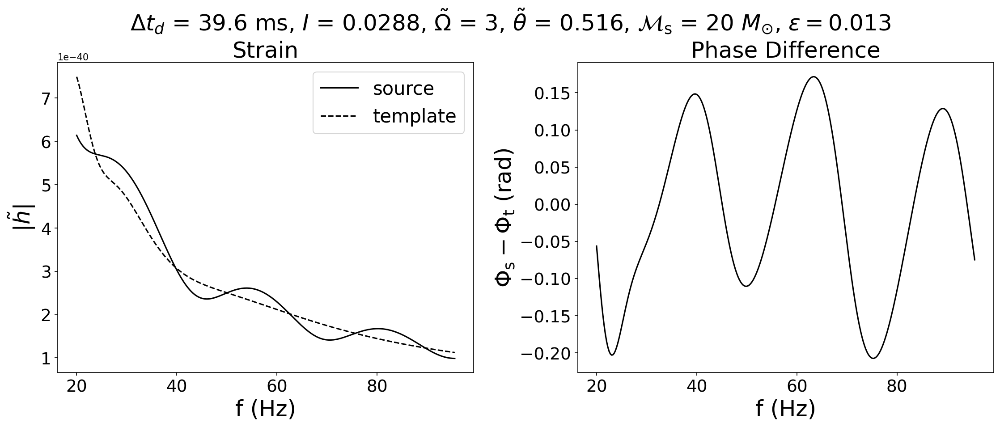

idx = -8.58592e-10, phi = 2.36598e-08, both should be ~0 if get_updated_mismatch_results is True


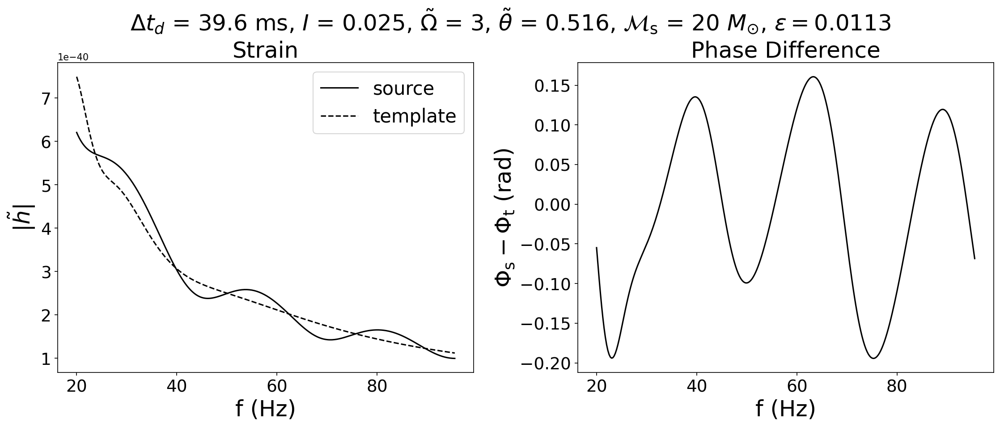

idx = -8.54365e-10, phi = 8.93427e-09, both should be ~0 if get_updated_mismatch_results is True


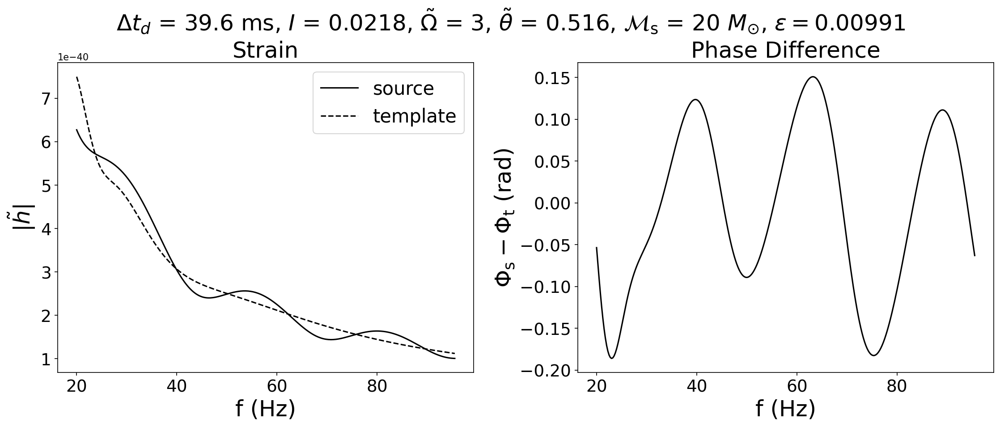

idx = 2.79475e-09, phi = -1.31321e-08, both should be ~0 if get_updated_mismatch_results is True


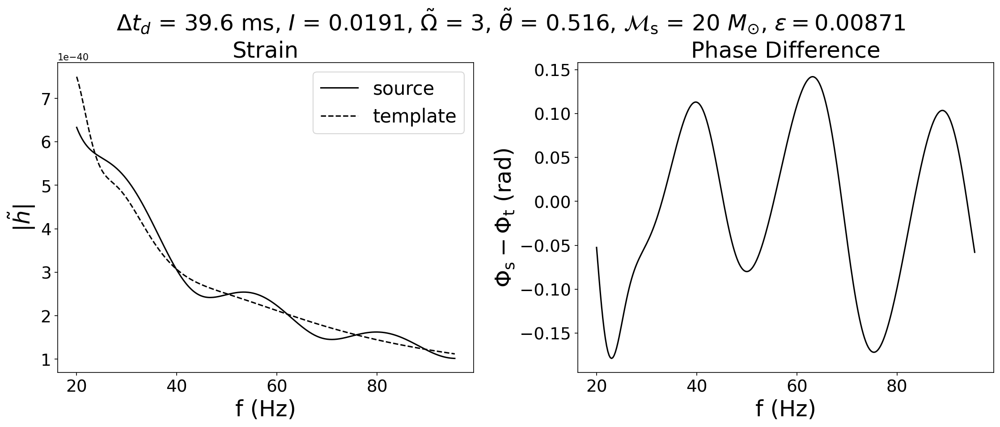

idx = 1.21555e-08, phi = -4.39384e-08, both should be ~0 if get_updated_mismatch_results is True


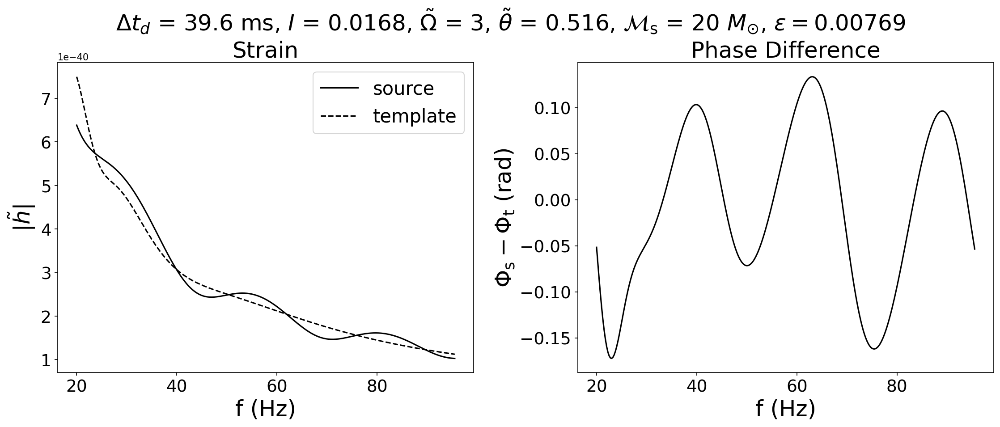

idx = 1.57376e-08, phi = -1.24177e-08, both should be ~0 if get_updated_mismatch_results is True


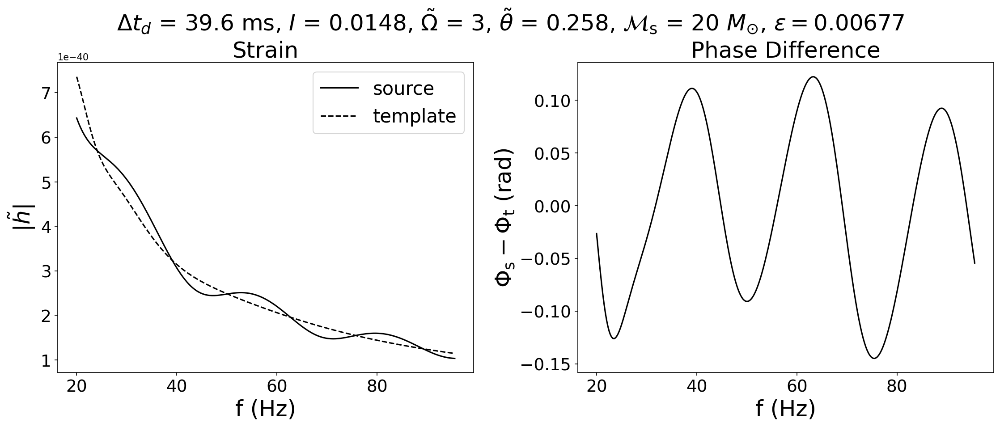

idx = -2.87744e-08, phi = 1.56297e-08, both should be ~0 if get_updated_mismatch_results is True


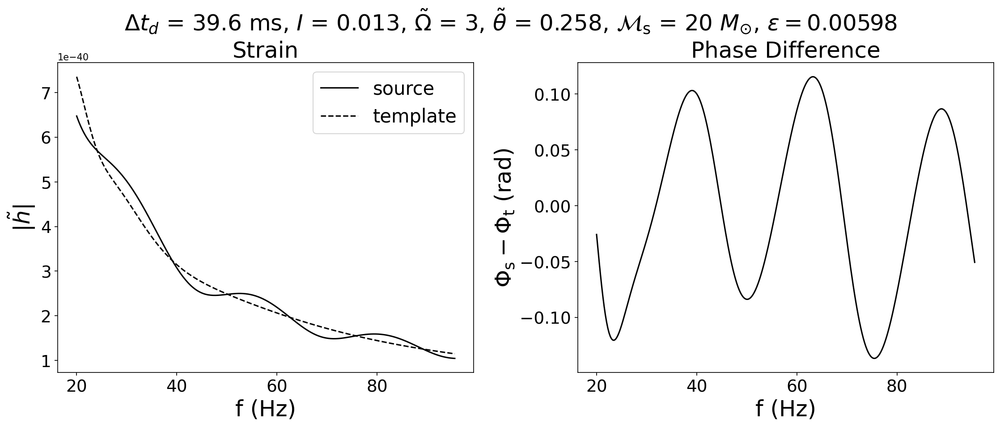

idx = 3.20006e-09, phi = 9.5142e-09, both should be ~0 if get_updated_mismatch_results is True


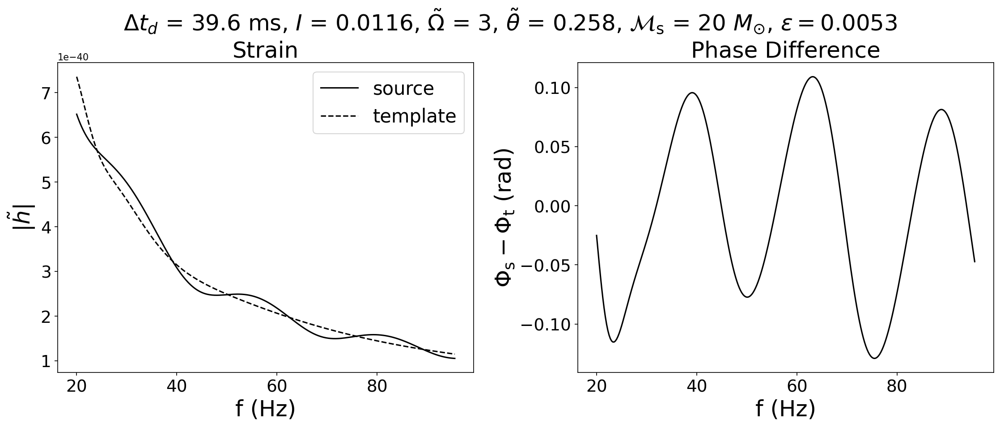

idx = -1.2765e-08, phi = 2.95367e-08, both should be ~0 if get_updated_mismatch_results is True


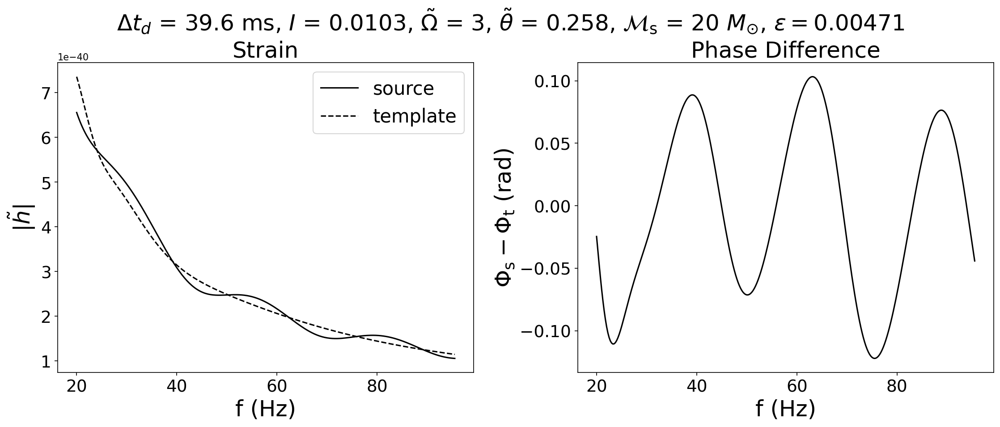

idx = -1.75158e-08, phi = 1.16888e-08, both should be ~0 if get_updated_mismatch_results is True


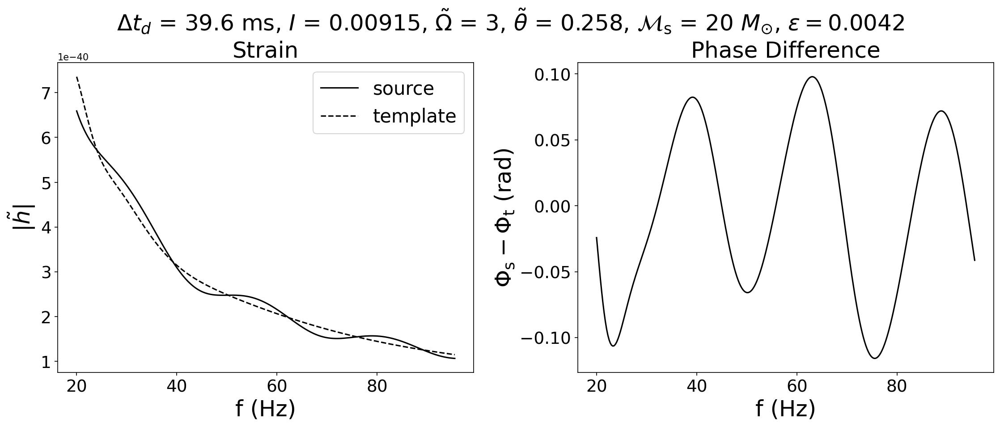

In [51]:
lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)

y_arr = data_I["y_arr"]
MLz_arr = data_I["MLz_arr"]
I_arr = data_I["I_arr"]

for i in range(0, len(y_arr), 4):
    lens_params, RP_params = set_to_params(lens_params_1, RP_params_1)
    lens_params["y"] = y_arr[i]
    lens_params["MLz"] = MLz_arr[i] * solar_mass
    RP_params["omega_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_omega_tilde"]
    RP_params["theta_tilde"] = data_I[I_arr[i]]["stats"]["ep_min_theta_tilde"]
    RP_params["gamma_P"] = data_I[I_arr[i]]["stats"]["ep_min_gammaP"]

    plot_waveform_comparison(RP_params, lens_params, get_updated_mismatch_results=True)
    plt.show()